# CCADMACL (Midterm Exam)

## Import the libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

from collections import Counter

## Load the datasets

In [5]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")

df_arr = []
df_arr.append(face_df)
df_arr.append(chrome_df)
df_arr.append(lines2_df)
df_arr.append(supernova_df)
df_arr.append(network_df)
df_arr.append(spirals_df)
df_arr.append(densedisk_df)
df_arr.append(rings_df)
df_arr.append(chainlink_df)


## Plot the datasets

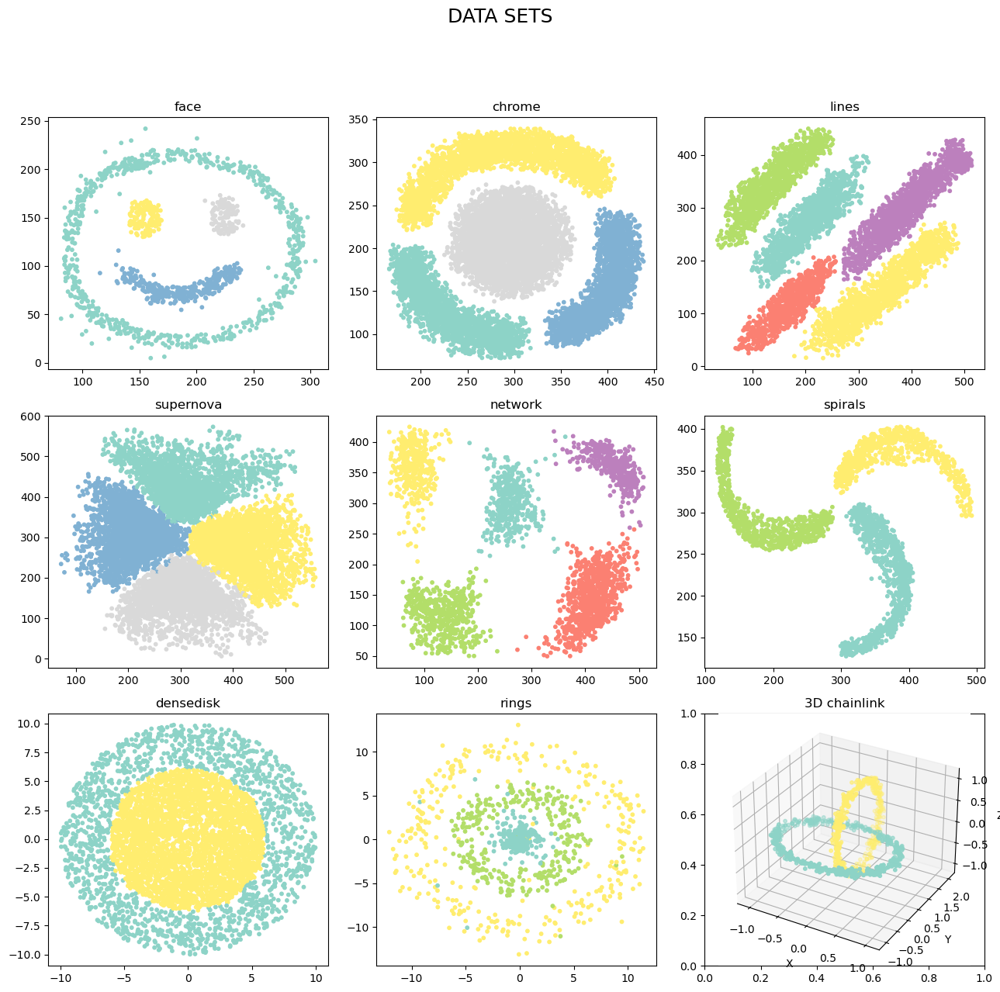

In [4]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
fig.suptitle('DATA SETS\n', size=18)

# Plot the 2D scatterplots
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("rings")

# Add a 3D plot
ax3d = fig.add_subplot(3, 3, 9, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

## A. Use K-means to cluster each dataset

1. Create each copy of the dataset for k-means

c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


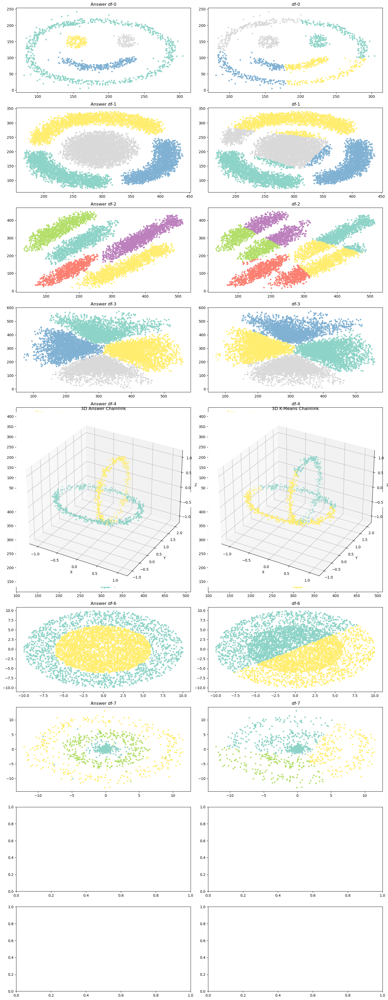

In [82]:

# put your answer here
from sklearn.cluster import KMeans
fig, axes = plt.subplots(nrows=9, ncols=2,figsize=(15,40))
for i, df in enumerate(df_arr):
    X_principal = df[['x', 'y']]
    kmeans = KMeans(n_clusters = len(df['color'].unique()), init = 'k-means++', random_state = 42, n_init=10)
    y_ans = kmeans.fit_predict(X_principal)
    df['Cluster'] = y_ans
    if i != 8:
        axes[i,0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
        axes[i,0].set_title(f"Answer df-{i}")
        axes[i,1].scatter(df['x'], df['y'], c=df['Cluster'], s=10, cmap = "Set3")
        axes[i,1].set_title(f" df-{i}")



plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


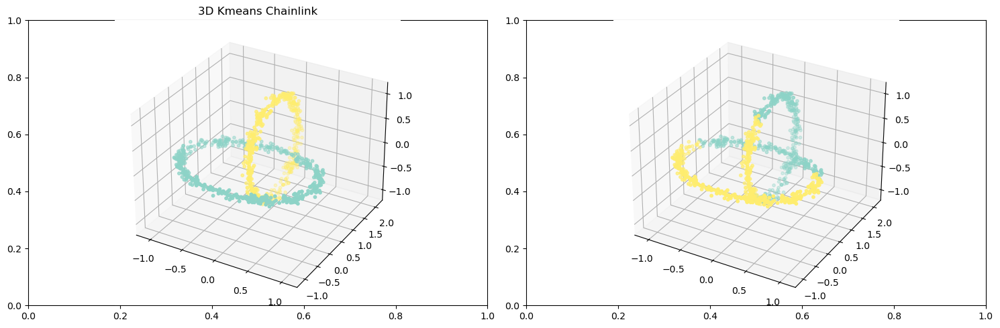

In [87]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
kmeans = KMeans(n_clusters = len(df['color'].unique()), init = 'k-means++', random_state = 42, n_init=10)
y_ans = kmeans.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D Kmeans Chainlink")


# Adjust layout to avoid overlap and display the plots
plt.tight_layout()
plt.show()

2. Drop the "color" column on all datasets

In [79]:
# put your answer here

3. Train a K-means model for each dataset.

In [80]:
# put your answer here

4. Add a "Cluster" column for each data set

In [81]:
# put your answer here

5. Plot the Correct cluster and the K-means cluster

In [82]:
# put your answer here

## B. Use Agglomerative Clustering to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

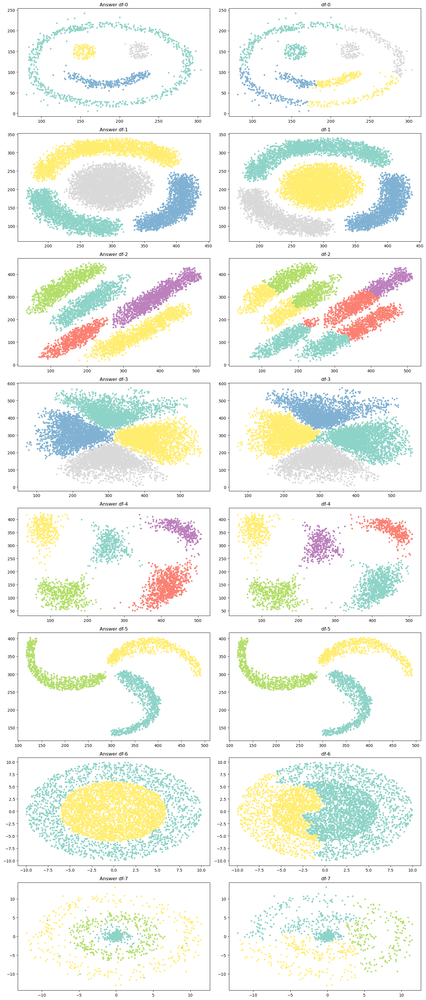

In [90]:

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
fig, axes = plt.subplots(nrows=8, ncols=2,figsize=(15,35))
for i, df in enumerate(df_arr):
    if i != 8:
        X_principal = df[['x', 'y']]
        agglo_model = AgglomerativeClustering(n_clusters=len(df['color'].unique()), metric='euclidean', linkage = 'ward')
        y_ans = agglo_model.fit_predict(X_principal)
        df['Cluster'] = y_ans
        axes[i,0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
        axes[i,0].set_title(f"Answer df-{i}")
        axes[i,1].scatter(df['x'], df['y'], c=df['Cluster'], s=10, cmap = "Set3")
        axes[i,1].set_title(f" df-{i}")
plt.tight_layout()
plt.show()





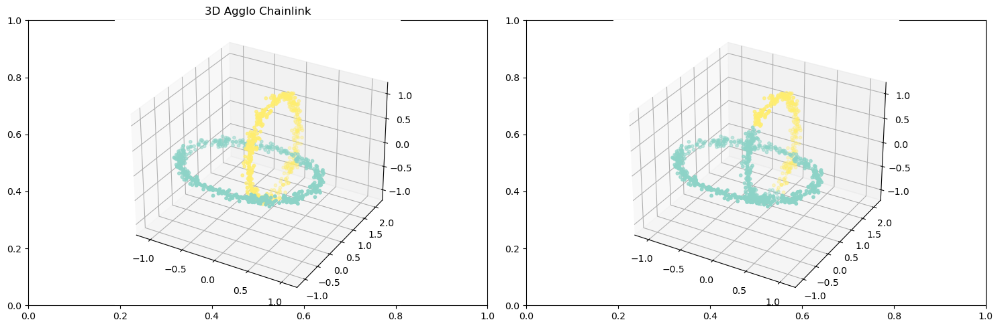

In [91]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
agglo_model = AgglomerativeClustering(n_clusters=len(df['color'].unique()), metric='euclidean', linkage = 'ward')
y_ans = agglo_model.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D Agglo Chainlink")
plt.tight_layout()
plt.show()

2. Drop the "color" column on all datasets

In [84]:
# put your answer here

3. Train a Agglomerative Clustering model for each dataset.

In [85]:
# put your answer here

4. Add a "Cluster" column for each data set

In [86]:
# put your answer here

5. Plot the Correct cluster and the Agglomerative cluster

In [87]:
# put your answer here

## C. Use DBSCAN to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

## FIND EPSILON

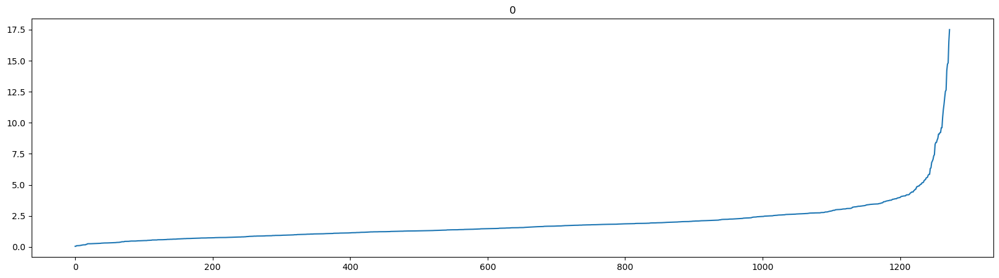

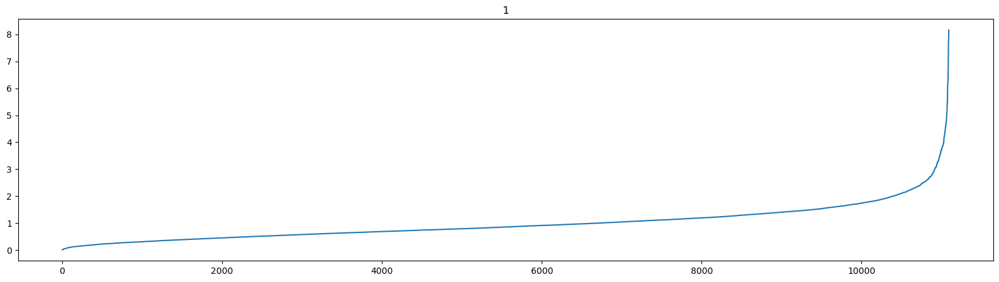

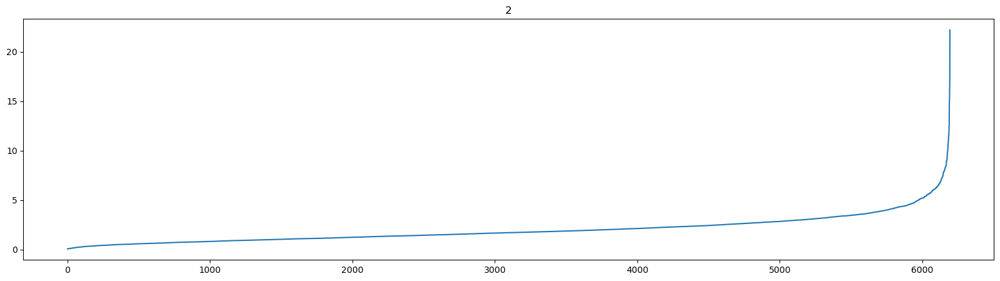

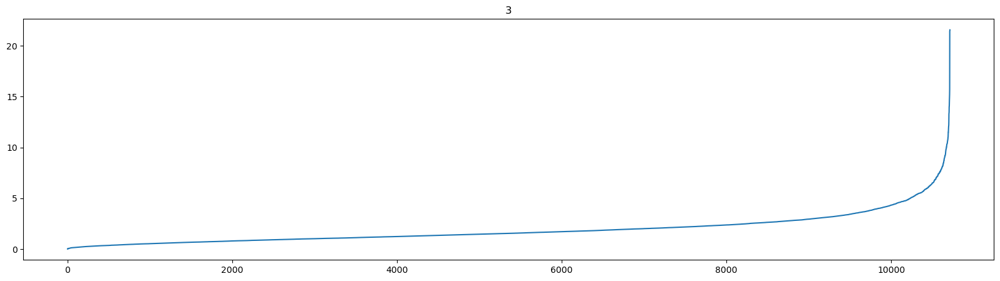

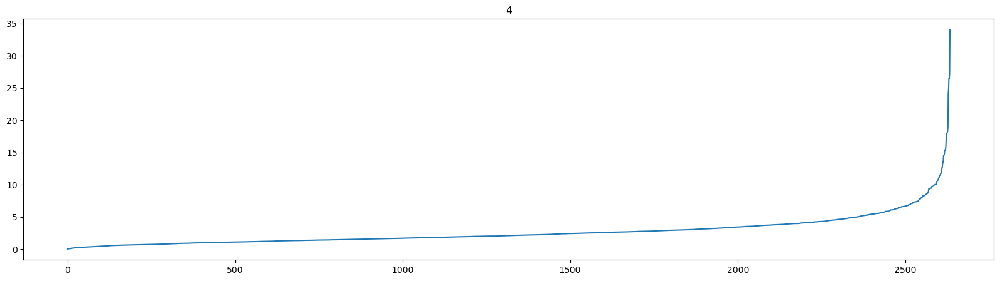

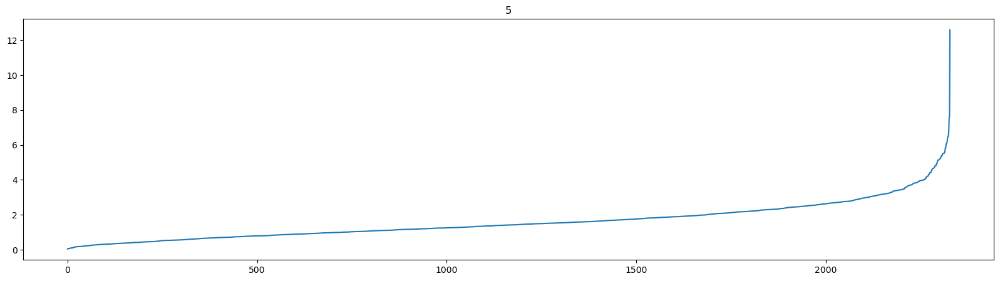

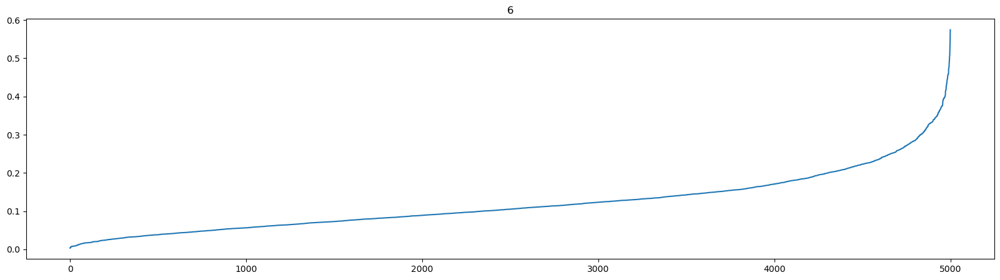

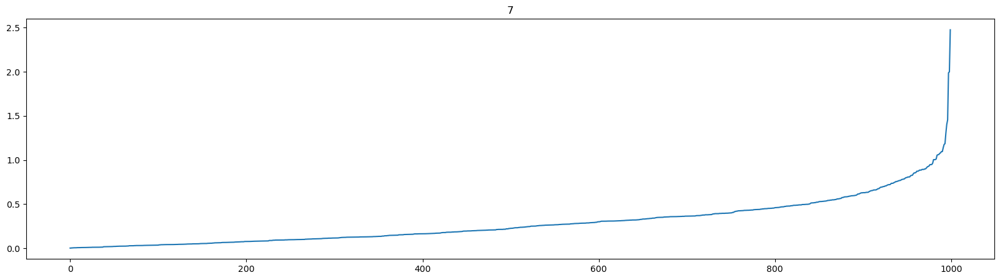

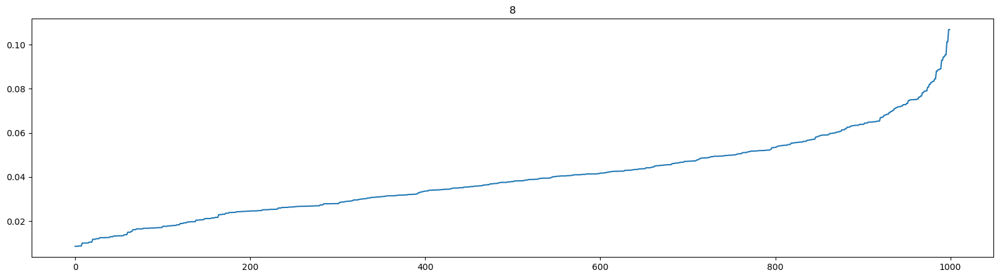

In [190]:
# put your answer here

from sklearn.neighbors import NearestNeighbors

for i, df in enumerate(df_arr):
    X_principal = df[['x', 'y']] if i != 8 else df[['x', 'y', 'z']]
    neighbors = NearestNeighbors(n_neighbors=4 if i != 8 else 6)
    nfit = neighbors.fit(X_principal)
    distance, indices = nfit.kneighbors(X_principal)
    distances = np.sort(distance, axis=0)
    plt.figure(figsize=(20,5))
    plt.title(i)
    plt.plot(distances[:, 1])
    
    


2. Drop the "color" column on all datasets

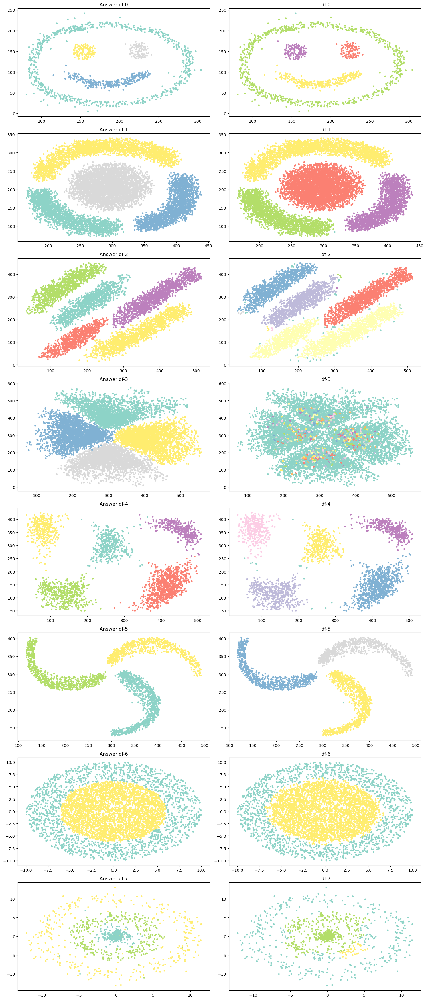

In [283]:

# put your answer here
from sklearn.cluster import DBSCAN

eps_db_list = [17.5, 8.1, 9, 2, 20, 9, 0.60, 2.53, 0.12]
fig, axes = plt.subplots(nrows=8, ncols=2,figsize=(15,35))
for i, df in enumerate(df_arr):
    if i != 8:
        X_principal = df[['x', 'y']]
        db_model = DBSCAN(eps=eps_db_list[i], min_samples=4, metric='euclidean') 
        if i == 7:
            db_model = DBSCAN(eps=2.53, min_samples=45, metric='manhattan')
        if i == 6:
            db_model = DBSCAN(eps=1, min_samples=45, metric='manhattan')
        y_ans = db_model.fit_predict(X_principal)
        df['Cluster'] = y_ans
        axes[i,0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
        axes[i,0].set_title(f"Answer df-{i}")
        axes[i,1].scatter(df['x'], df['y'], c=df['Cluster'], s=10, cmap = "Set3")
        axes[i,1].set_title(f" df-{i}")
plt.tight_layout()
plt.show()

3
3


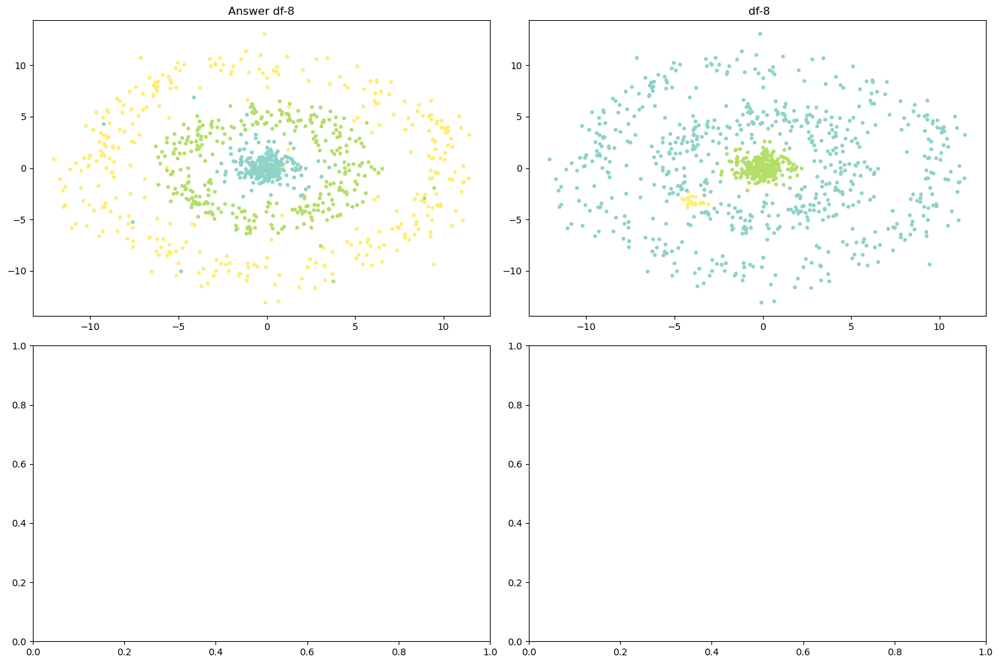

{'braycurtis',
 'canberra',
 'chebyshev',
 'cityblock',
 'correlation',
 'cosine',
 'dice',
 'euclidean',
 'hamming',
 'haversine',
 'jaccard',
 'kulsinski',
 'l1',
 'l2',
 'mahalanobis',
 'manhattan',
 'matching',
 'minkowski',
 'nan_euclidean',
 'precomputed',
 'rogerstanimoto',
 'russellrao',
 'seuclidean',
 'sokalmichener',
 'sokalsneath',
 'sqeuclidean',
 'wminkowski',
 'yule'}

In [342]:

fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(15,10))
df = df_arr[7]
print(len(df['color'].unique()))
X_principal = df[['x', 'y']]
# db_model = DBSCAN(eps=1, min_samples=45, metric='manhattan')
db_model = DBSCAN(eps=1.08, min_samples=17, metric='manhattan')
# db_model = DBSCAN(eps=2.3, min_samples=44, metric='manhattan')
# db_model = DBSCAN(eps=1, min_samples=400, metric='cosine')
y_ans = db_model.fit_predict(X_principal)
df['Cluster'] = y_ans
print(len(df['Cluster'].unique()))
axes[0,0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
axes[0,0].set_title(f"Answer df-{i}")
axes[0,1].scatter(df['x'], df['y'], c=df['Cluster'], s=10, cmap = "Set3")
axes[0,1].set_title(f" df-{i}")
plt.tight_layout()
plt.show()

{'nan_euclidean', 'euclidean', 'chebyshev', 'canberra', 'jaccard', 'braycurtis', 'matching', 'sqeuclidean', 'cityblock', 'haversine', 'l2', 'hamming', 'mahalanobis', 'manhattan', 'seuclidean', 'yule', 'l1', 'correlation', 'minkowski', 'sokalmichener', 'sokalsneath', 'dice', 'kulsinski', 'wminkowski', 'rogerstanimoto', 'cosine', 'precomputed', 'russellrao'}

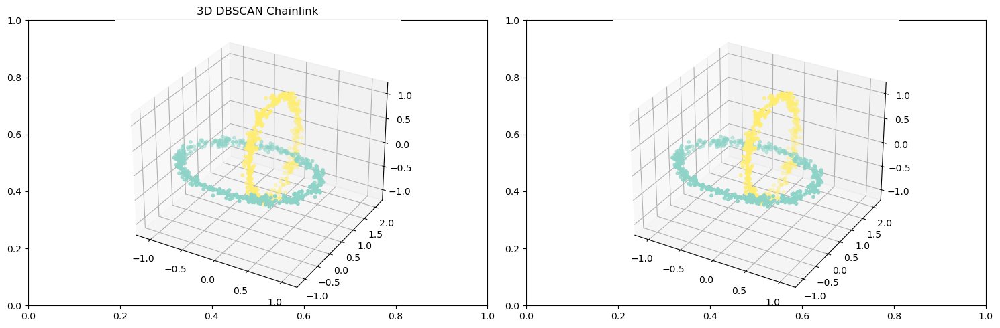

In [96]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
db_model = DBSCAN(eps=0.12, min_samples=6, metric='euclidean')
y_ans = db_model.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D DBSCAN Chainlink")
plt.tight_layout()
plt.show()

3. Train a DBSCAN Clustering model for each dataset.

In [90]:
# put your answer here

4. Add a "Cluster" column for each data set

In [91]:
# put your answer here

5. Plot the Correct cluster and the DBSCAN cluster

In [92]:
# put your answer here

## D. Compare all algorithms

1. Display the Correct cluster, K-means cluster, Agglomerative cluster and DBSCAN cluster in a single plot.

- Each row should contain each dataset
- Each column should contain each the correct cluster, k-means cluster, agglomerative cluster and DBSCAN cluster.

c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(
c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


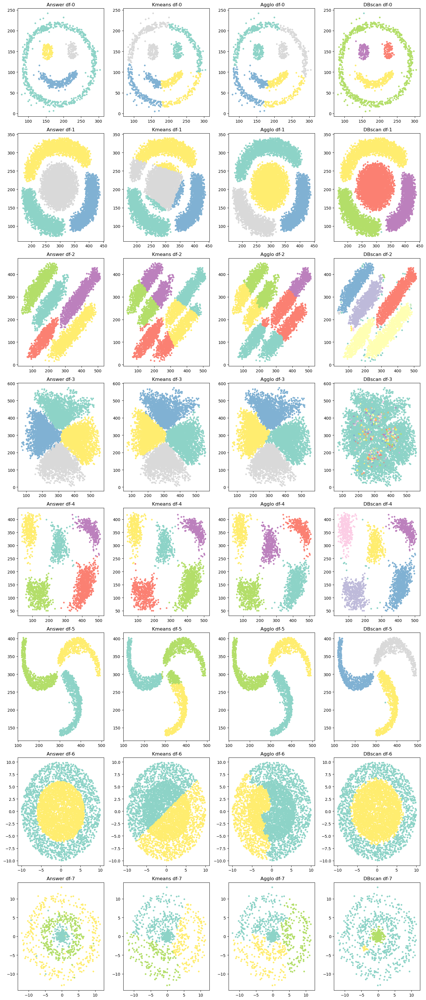

In [343]:

# put your answer here
fig, axes = plt.subplots(nrows=8, ncols=4,figsize=(15,35))
for i, df in enumerate(df_arr):
    if i != 8:
        X_principal = df[['x', 'y']]
        agglo_model = AgglomerativeClustering(n_clusters=len(df['color'].unique()), metric='euclidean', linkage = 'ward')
        db_model = DBSCAN(eps=eps_db_list[i], min_samples=4, metric='euclidean')
        kmeans = KMeans(n_clusters = len(df['color'].unique()), init = 'k-means++', random_state = 42, n_init=10)
        if i == 7:
            # db_model = DBSCAN(eps=2.53, min_samples=45, metric='manhattan')
            db_model = DBSCAN(eps=1.08, min_samples=17, metric='manhattan')
        if i == 6:
            db_model = DBSCAN(eps=1, min_samples=45, metric='manhattan')
        y_ans_a = agglo_model.fit_predict(X_principal)
        y_ans_k = kmeans.fit_predict(X_principal)
        y_ans_d = db_model.fit_predict(X_principal)

        # df['DCluster'] = y_ans
        axes[i,0].scatter(df['x'], df['y'], c=df['color'], s=10, cmap = "Set3")
        axes[i,0].set_title(f"Answer df-{i}")
        
        axes[i,1].scatter(df['x'], df['y'], c=y_ans_k, s=10, cmap = "Set3")
        axes[i,1].set_title(f" Kmeans df-{i}")
        
        axes[i,2].scatter(df['x'], df['y'], c=y_ans_a, s=10, cmap = "Set3")
        axes[i,2].set_title(f" Agglo df-{i}")
        
        axes[i,3].scatter(df['x'], df['y'], c=y_ans_d, s=10, cmap = "Set3")
        axes[i,3].set_title(f" DBscan df-{i}")
plt.tight_layout()
plt.show()

c:\Users\rainn\miniconda3\envs\mainenv\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


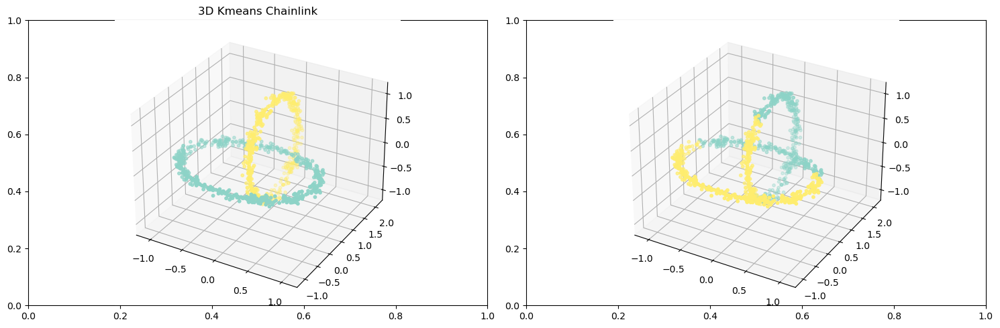

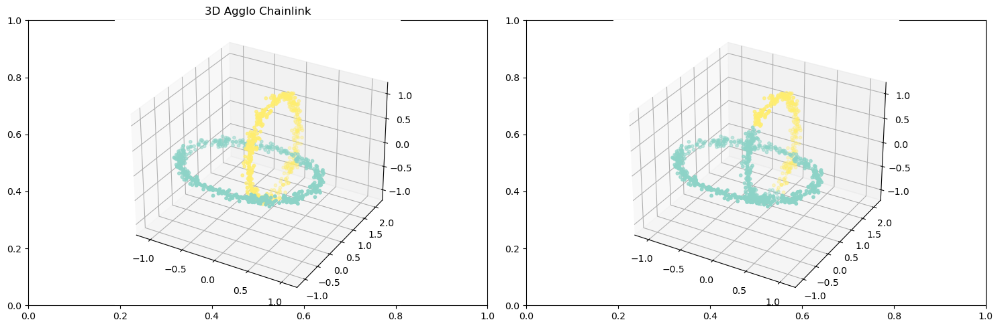

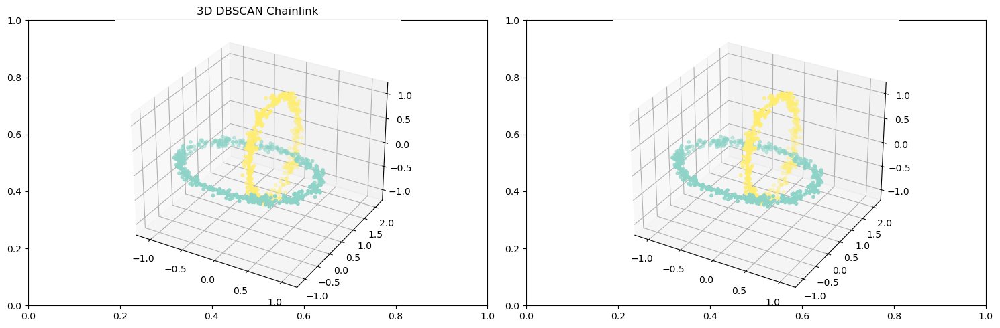

In [97]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
kmeans = KMeans(n_clusters = len(df['color'].unique()), init = 'k-means++', random_state = 42, n_init=10)
y_ans = kmeans.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D Kmeans Chainlink")


# Adjust layout to avoid overlap and display the plots
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
agglo_model = AgglomerativeClustering(n_clusters=len(df['color'].unique()), metric='euclidean', linkage = 'ward')
y_ans = agglo_model.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D Agglo Chainlink")
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
df = df_arr[8]
X_principal = df[['x', 'y','z']]
db_model = DBSCAN(eps=0.12, min_samples=6, metric='euclidean')
y_ans = db_model.fit_predict(X_principal)
df['Cluster'] = y_ans
ax3d = fig.add_subplot(121, projection='3d')
ax3d.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
ax3d.set_title("3D Answer Chainlink")
ax3d_kmeans = fig.add_subplot(122, projection='3d')
ax3d_kmeans.scatter(df['x'], df['y'], df['z'], c=df['Cluster'], cmap="Set3", s=10)
ax3d.set_title("3D DBSCAN Chainlink")
plt.tight_layout()
plt.show()